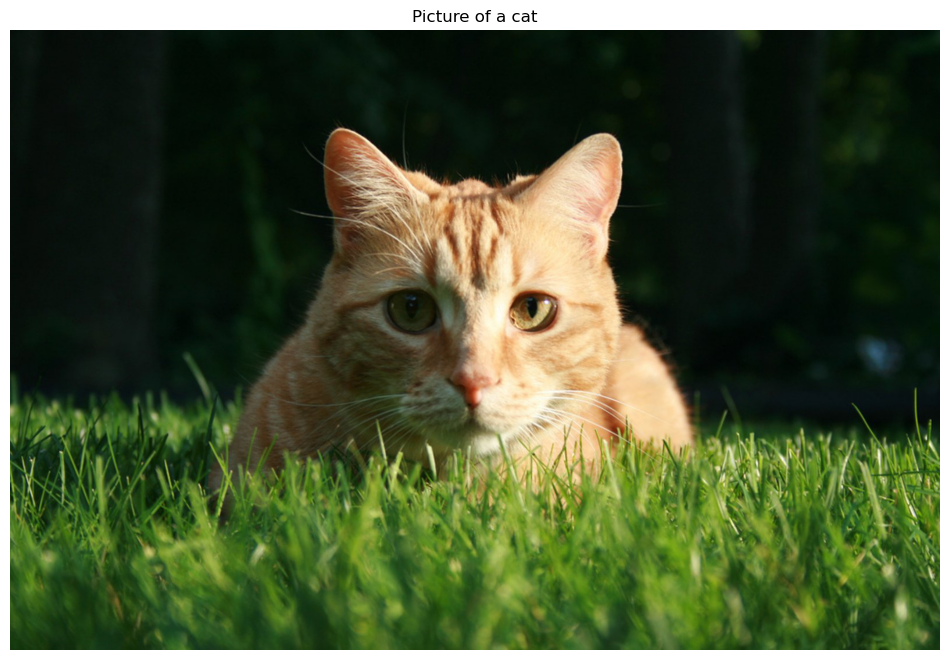

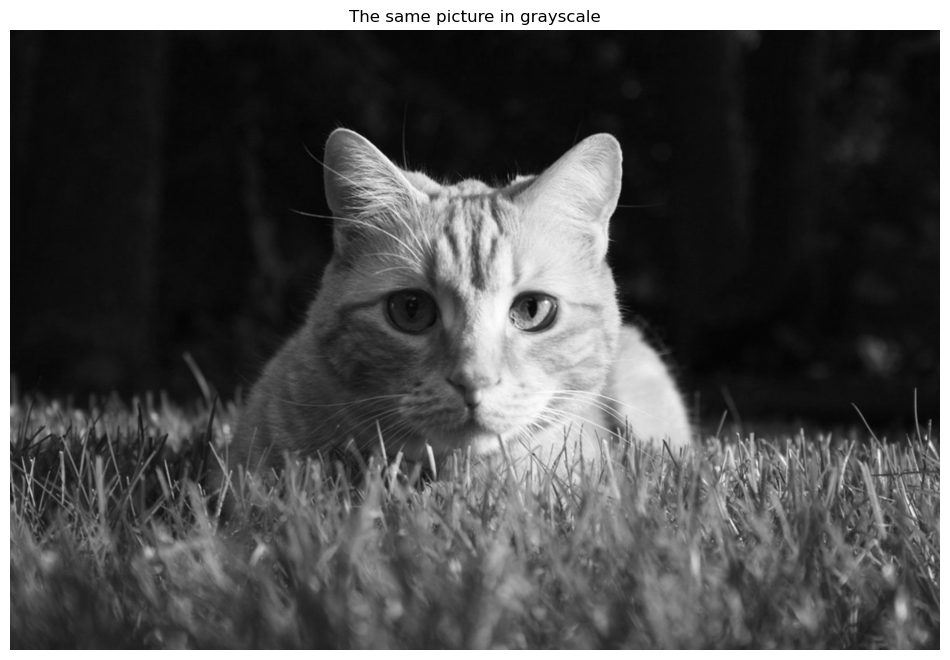

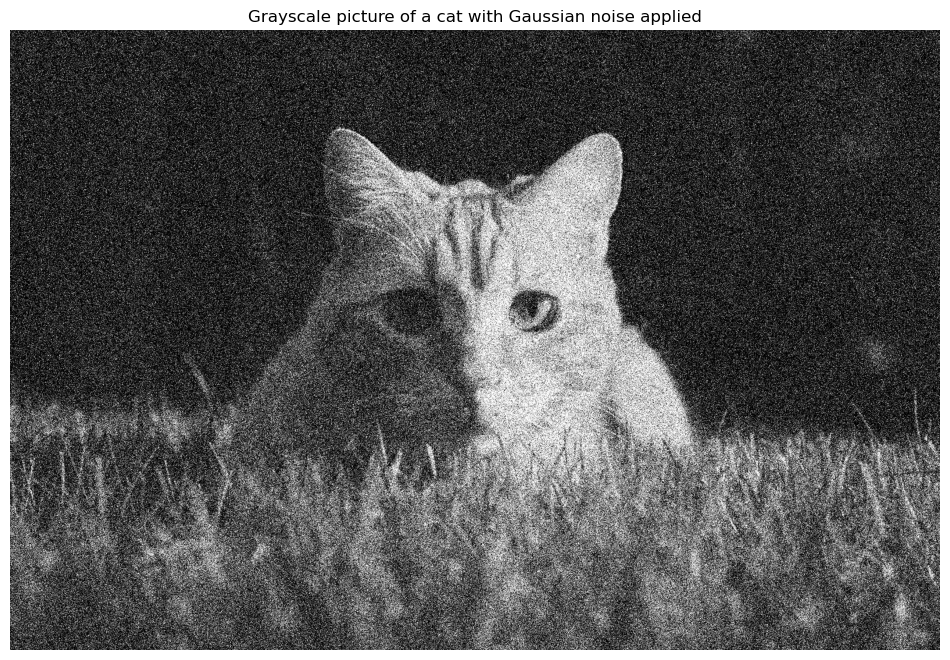

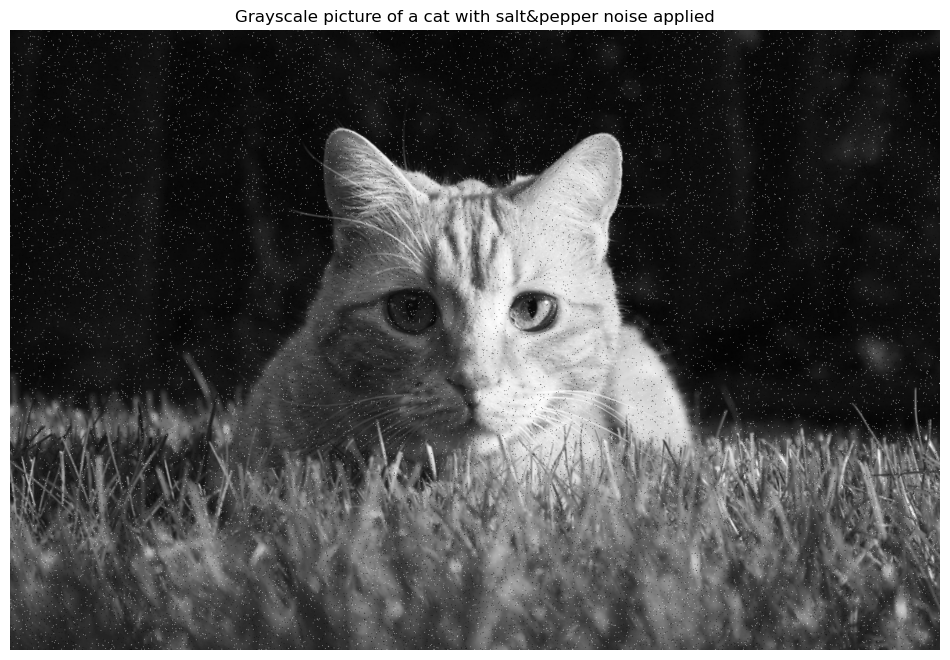

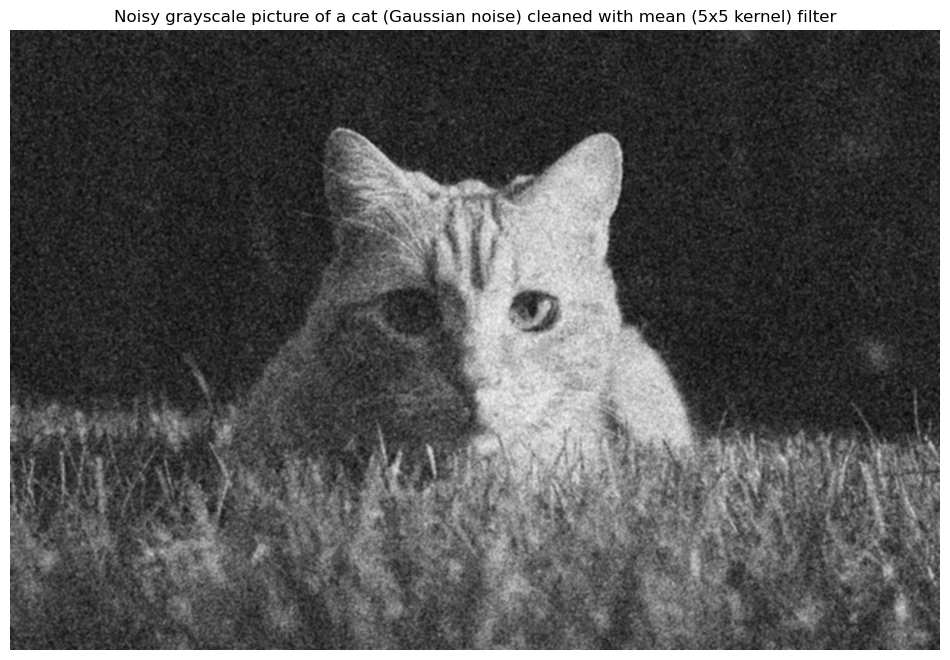

...

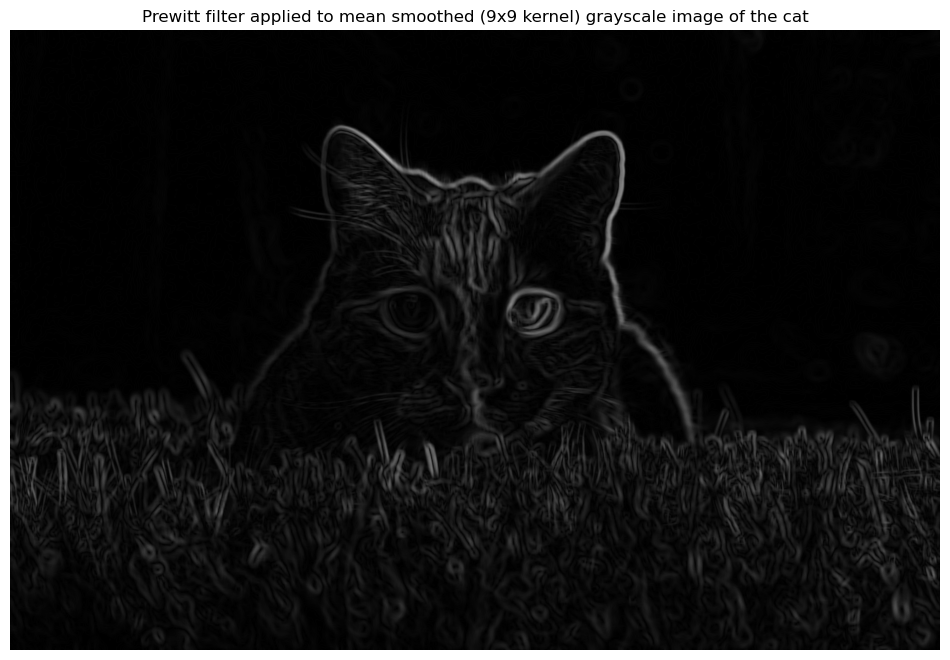

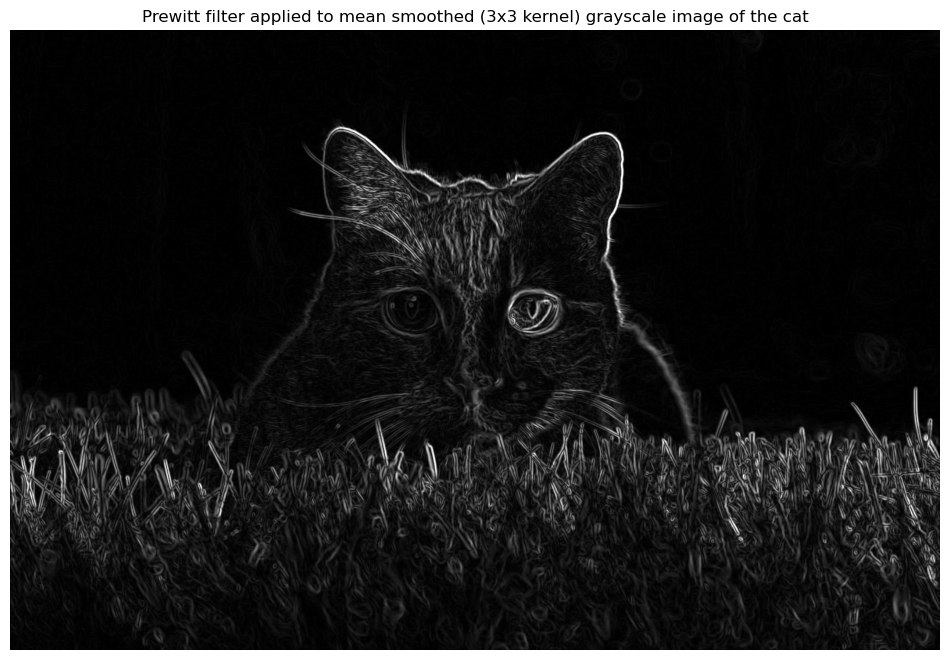

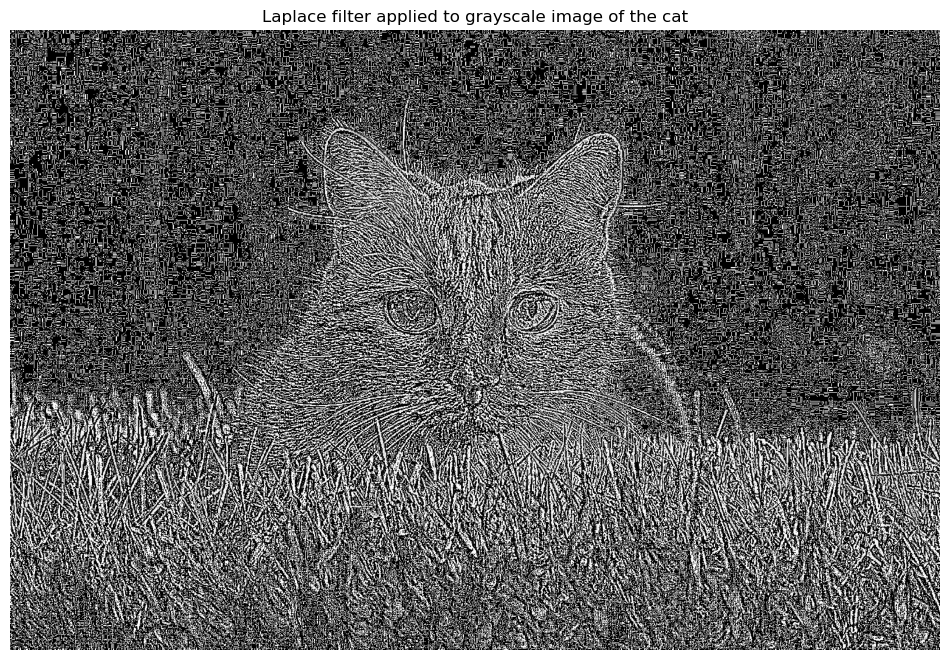

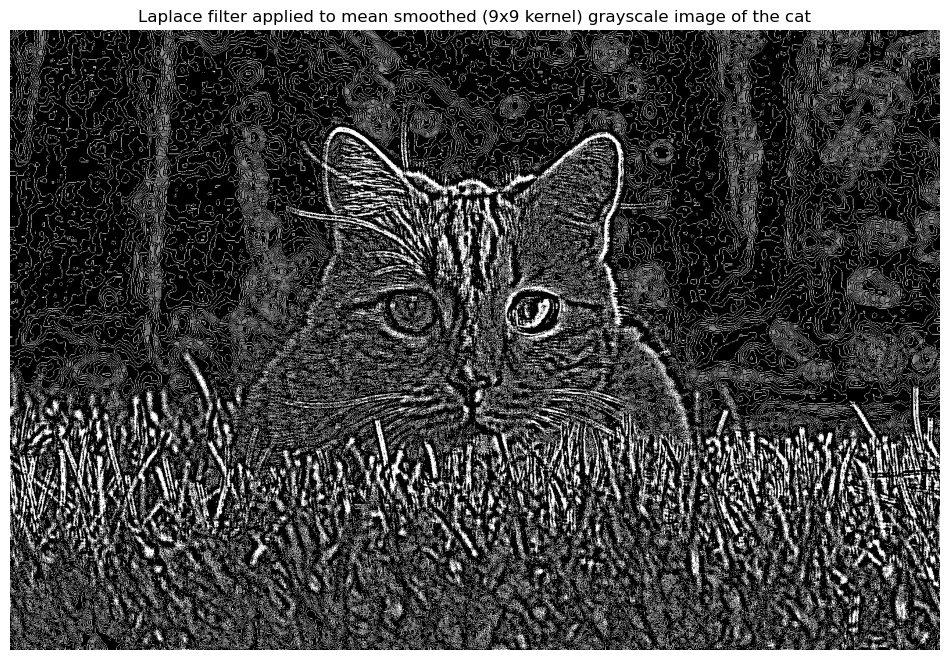

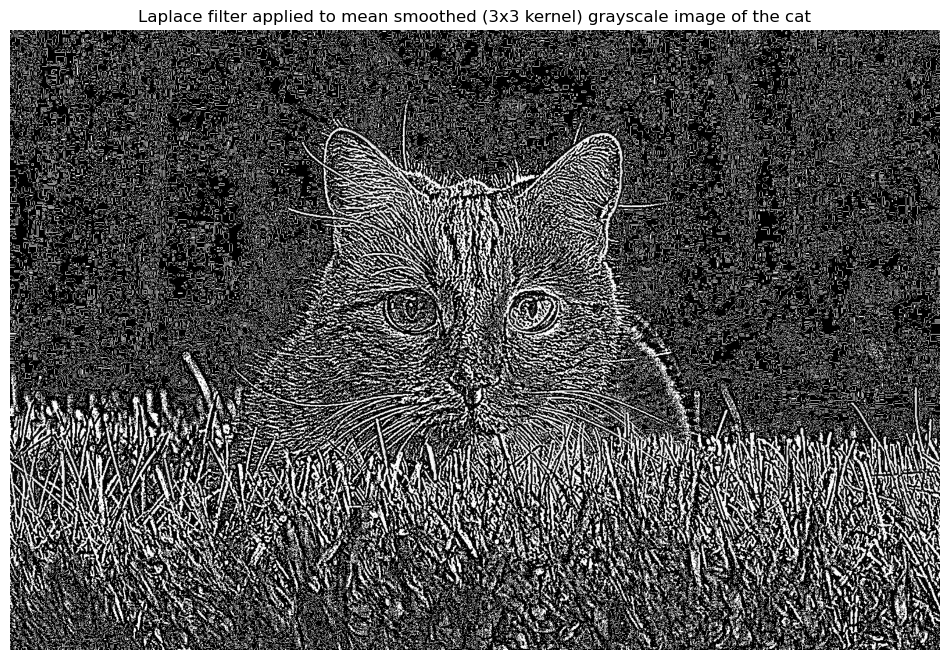

In [2]:
import numpy as np

def vertical_padding(img):
    "Returns a padded 2D np.array with collumns replicated near the vertical edges. Works with any amount of channels."
    
    try:
        img = np.insert(img, img.shape[1], img[:, -1, :], axis=1)
        img = np.insert(img, 0, img[:, 0, :], axis=1)
    except:
        img = np.insert(img, img.shape[1], img[:, -1], axis=1)
        img = np.insert(img, 0, img[:, 0], axis=1)
        
    return img

def horizontal_padding(img):
    "Returns a padded 2D np.array with rows replicated near the horizontal edges. Works with any amount of channels."
    
    try:
        img = np.insert(img, img.shape[0], img[-1, :, :], axis=0)
        img = np.insert(img, 0, img[0, :, :], axis=0)
    except:
        img = np.insert(img, img.shape[0], img[-1, :], axis=0)
        img = np.insert(img, 0, img[0, :], axis=0)
        
    return img

def overflow_avoidance(img):
    "Makes sure that the values in the array are bounded in the range [0, 255]. Note that this has no effect on input of np.uint8 type."
    
    mask = img > 255
    img[mask] = 255
    mask = img < 0
    img[mask] = 0
    
    return img

def myConv2(A, B, same_dim=True):
    "Returns a convolution of 2 2D arrays. The dimensionsionality can either be reduced or kept the same."
    "The bigger matrix is used as the image and the smaller one as the filter."
    
    if not isinstance(A, np.ndarray): A = np.array(A)
    if not isinstance(B, np.ndarray): B = np.array(B)
    if A.size >= B.size: filterr, img = np.flip(B), A
    else: filterr, img = np.flip(A), B
    x, y = filterr.shape[0]//2, filterr.shape[1]//2
    if same_dim:
        for _ in range(x):
            img = horizontal_padding(img)
        for _ in range(y):
            img = vertical_padding(img)
    conv = np.empty((img.shape[0]-2*x, img.shape[1]-2*y))
    for i in range(x, img.shape[0]-x):
        for j in range(y, img.shape[1]-y):
            conv[i-x, j-y] = np.einsum("ij,ij", img[i-x:i+x+1, j-y:j+y+1], filterr)
            
    return conv

def myColorToGray(A, c_weights=[0.299, 0.587, 0.114]):
    "Returns a grayscale version of an RGB image."
    
    if not isinstance(A, np.ndarray): A = np.array(A)
        
    return np.einsum("ijk,k->ij", A, c_weights).astype(np.uint8)

def myImNoise(A, n_type="g", par=(0, 0.1)):
    "Adds Gaussian (g) or salt&pepper (sp) noise to the image. Gaussian noise accepts mean and standard deviation parameters."
    "sp noise accepts probabilities that any given pixel will be turned black or white. Works with any amount of channels."
    
    if not isinstance(A, np.ndarray): A = np.array(A)
    
    if n_type == "g":
        A = A.astype(np.float16)
        try:
            noise = np.zeros((A.shape[0], A.shape[1], A.shape[2]))
            noise.flat = np.random.normal(par[0], par[1], A.shape[0]*A.shape[1]*A.shape[2]) * 255 // 1
        except:
            noise = np.zeros((A.shape[0], A.shape[1]))
            noise.flat = np.random.normal(par[0], par[1], A.shape[0]*A.shape[1]) * 255 // 1
        A += noise.astype(np.float16)
        A = overflow_avoidance(A)
        
    elif n_type == "sp":
        random_n = np.random.random((A.shape[0], A.shape[1], 2))
        for i in range(A.shape[0]):
            for j in range(A.shape[1]):
                try:
                    if random_n[i, j, 0] < par[0]: A[i, j, :] = [0] * A.shape[2]
                    elif random_n[i, j, 1] < par[1]: A[i, j, :] = [255] * A.shape[2]
                except:
                    if random_n[i, j, 0] < par[0]: A[i, j] = 0
                    elif random_n[i, j, 1] < par[1]: A[i, j] = 255
                        
    else: raise Exception("Only 2 noise types supported: gaussian (g) and salt&pepper (sp).")
        
    return A.astype(np.uint8)

def myImFilter(A, f_size=(3, 3), f_type="median"): 
    "Attempts to remove noise using mean and median pixel value methods and returns the cleaned image. Works with any amount of channels."
    
    if not isinstance(f_size, tuple) or len(f_size) != 2: raise Exception("Filter dimensions are only accepted as a 2D tuple.")
    if not isinstance(A, np.ndarray): A = np.array(A)
        
    if f_type == "mean":
        filterr = np.zeros(f_size) + 1 / (f_size[0] * f_size[1])
        try:
            for k in range(A.shape[2]):
                A[:, :, k] = myConv2(A[:, :, k], filterr)
        except: A = myConv2(A, filterr)
            
    elif f_type == "median":
        x, y = f_size[0]//2, f_size[1]//2
        for _ in range(x):
            A = horizontal_padding(A)
        for _ in range(y):
            A = vertical_padding(A)
        for i in range(x, A.shape[0]-x):
            for j in range(y, A.shape[1]- y):
                try:
                    for k in range(A.shape[2]):
                        A[i, j, k] = np.median(A[i-x:i+x+1, j-y:j+y+1, k])
                except:
                    A[i, j] = np.median(A[i-x:i+x+1, j-y:j+y+1])
        try: A = A[x:A.shape[0]-x, y:A.shape[1]- y, :]
        except: A = A[x:A.shape[0]-x, y:A.shape[1]- y]
            
    else: raise Exception("Only 2 noise filtering options supported: mean and median.")
        
    return A.astype(np.uint8)
    
def myEdgeDetection(A, f_type="sobel"):
    "Edge detection using the Sobel, Prewitt and Laplacian methods. Returns the resulting image."
    
    if not isinstance(A, np.ndarray): A = np.array(A)
        
    if f_type == "sobel":
        filterx = np.array([[1, 0, -1],
                            [2, 0, -2],
                            [1, 0, -1]])
        filtery = np.array([[1, 2, 1],
                            [0, 0, 0],
                            [-1, -2, -1]])
        A = np.sqrt(np.square(myConv2(A, filterx))  + np.square(myConv2(A, filtery)))
        A = overflow_avoidance(A) 
        
    elif f_type == "prewitt":
        filterx = np.array([[1,0, -1],
                            [1, 0, -1],
                            [1, 0, -1]])
        filtery = np.array([[1, 1, 1],
                            [0, 0, 0],
                            [-1, -1, -1]])
        A = np.sqrt(np.square(myConv2(A, filterx))  + np.square(myConv2(A, filtery)))
        A = overflow_avoidance(A)
        
    elif f_type == "laplacian":
        filterr = np.array([[0.25, 0.5, 0.25],
                            [0.5, -3, 0.5],
                            [0.25, 0.5, 0.25]])
        A = myConv2(A, filterr)
        
    else: raise Exception("Only 3 edge detection options implemented: sobel, prewitt and laplacian.")
        
    return A.astype(np.uint8)
        
def tests(conv=0, gray=0, noise=1, filt=0, edge=0):
    "Tests for all the implemented functions"
    
    #For saving images:
    #from PIL import Image
    #im = Image.fromarray(img1)
    #im.save("noisy_cat_g.jpg")
    
    import matplotlib.pyplot as plt
    import matplotlib.image as ige
    import time
    img = ige.imread("cat.jpg").copy()
    plt.rcParams["figure.figsize"] = (12, 9)
    imgplot = plt.imshow(img)
    plt.title("Picture of a cat")
    plt.axis('off')
    plt.show()
    start = time.time()
    
    if conv:
        filterr = [[-1,-1,-1],
                   [-1,8,-1],
                   [-1,-1,-1]]
        img = ige.imread("gray_cat.jpg").copy()
        img1 = myConv2(img, filterr)
        img2 = myConv2(img, filterr, False)
        imgplot = plt.imshow(img1, cmap='gray', vmin=0, vmax=255)
        plt.title("Grayscale image convoluted with ridge detection filter (dimensions are kept)")
        plt.axis('off')
        plt.show()
        print("Image dimensions:\n", img1.shape)
        imgplot = plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
        plt.title("Grayscale image convoluted with ridge detection filter (image dimensions are reduced to avoid edge effects)")
        plt.axis('off')
        plt.show()
        print("Image dimensions:\n", img2.shape)
        
    if gray:
        img = myColorToGray(img)
        imgplot = plt.imshow(img, cmap='gray', vmin=0, vmax=255)
        plt.title("The same picture in grayscale")
        plt.axis('off')
        plt.show()
        
    if noise:
        img1 = myImNoise(img, n_type="g", par=(0, 0.1))
        img2 = myImNoise(img, n_type="sp", par=(0.005, 0.005))
        imgplot = plt.imshow(img1)
        plt.title("Picture of a cat with Gaussian noise applied")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img2)
        plt.title("Picture of a cat with salt&pepper noise applied")
        plt.axis('off')
        plt.show()
        
    if filt: #Due to inefficient implementation this part takes a while (a couple of minutes on my machine)
        img1 = ige.imread("noisy_cat_g.jpg").copy()
        img2 = ige.imread("noisy_cat_sp.jpg").copy()
        img11 = myImFilter(img1, (5, 5), f_type="mean")
        img12 = myImFilter(img1, (3, 3), f_type="median")
        img21 = myImFilter(img2, (5, 5), f_type="mean")
        img22 = myImFilter(img2, (3, 3), f_type="median")
        imgplot = plt.imshow(img1)
        plt.title("Noisy picture of a cat (Gaussian noise)")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img11)
        plt.title("Noisy picture of a cat (Gaussian noise) cleaned with mean filter")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img12)
        plt.title("Noisy picture of a cat (Gaussian noise) cleaned with median filter")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img2)
        plt.title("Noisy picture of a cat (salt&pepper noise)")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img21)
        plt.title("Noisy picture of a cat (salt&pepper noise) cleaned with mean filter")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img22)
        plt.title("Noisy picture of a cat (salt&pepper noise) cleaned with median filter")
        plt.axis('off')
        plt.show()
        
    if edge:
        img = ige.imread("gray_cat.jpg").copy()
        img1 = myEdgeDetection(img, f_type="sobel")
        img2 = myEdgeDetection(img, f_type="prewitt")
        img3 = myEdgeDetection(img, f_type="laplacian")
        imgplot = plt.imshow(img1, cmap='gray', vmin=0, vmax=255)
        plt.title("Edge detection using sobel filter")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
        plt.title("Edge detection using prewitt filter")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img3, cmap='gray', vmin=0, vmax=255)
        plt.title("Edge detection using laplacian filter")
        plt.axis('off')
        plt.show()
        
    print("The time of execution of above program is :",
      (time.time()-start) * 10**3, "ms")
    
def demo(show=1):
    "The demo requested in the task sheet"
    
    import matplotlib.pyplot as plt
    import matplotlib.image as ige
    plt.rcParams["figure.figsize"] = (12, 9)
    
    img = ige.imread("cat.jpg").copy()
    
    img_gray = myColorToGray(img)
    
    img_gray_noise_gaussian = myImNoise(img_gray, n_type="g", par=(0, 0.3))
    img_gray_noise_saltnpepper = myImNoise(img_gray.copy(), n_type="sp", par=(0.01, 0.01))
    
    img_gray_gnoise_mean_cleaned = myImFilter(img_gray_noise_gaussian, (5, 5), f_type="mean")
    img_gray_gnoise_median_cleaned  = myImFilter(img_gray_noise_gaussian, (3, 3), f_type="median")
    img_gray_sanoise_mean_cleaned  = myImFilter(img_gray_noise_saltnpepper, (5, 5), f_type="mean")
    img_gray_sanoise_median_cleaned = myImFilter(img_gray_noise_saltnpepper, (3, 3), f_type="median")
    
    A_edge_s = myEdgeDetection(img_gray, f_type="sobel")
    E_s = myImFilter(img_gray, f_size=(9, 9), f_type="mean")
    F_s = myImFilter(img_gray, f_size=(3, 3), f_type="mean")
    E_edge_s = myEdgeDetection(E_s, f_type="sobel")
    F_edge_s = myEdgeDetection(F_s, f_type="sobel")
    
    A_edge_p = myEdgeDetection(img_gray, f_type="prewitt")
    E_p = myImFilter(img_gray, f_size=(9, 9), f_type="mean")
    F_p = myImFilter(img_gray, f_size=(3, 3), f_type="mean")
    E_edge_p = myEdgeDetection(E_p, f_type="prewitt")
    F_edge_p = myEdgeDetection(F_p, f_type="prewitt")
    
    A_edge_l = myEdgeDetection(img_gray, f_type="laplacian")
    E_l = myImFilter(img_gray, f_size=(9, 9), f_type="mean")
    F_l = myImFilter(img_gray, f_size=(3, 3), f_type="mean")
    E_edge_l = myEdgeDetection(E_l, f_type="laplacian")
    F_edge_l = myEdgeDetection(F_l, f_type="laplacian")
    
    if show:
        imgplot = plt.imshow(img)
        plt.title("Picture of a cat")
        plt.axis('off')
        plt.show()
        
        imgplot = plt.imshow(img_gray, cmap='gray', vmin=0, vmax=255)
        plt.title("The same picture in grayscale")
        plt.axis('off')
        plt.show()
        
        imgplot = plt.imshow(img_gray_noise_gaussian, cmap='gray', vmin=0, vmax=255)
        plt.title("Grayscale picture of a cat with Gaussian noise applied")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img_gray_noise_saltnpepper, cmap='gray', vmin=0, vmax=255)
        plt.title("Grayscale picture of a cat with salt&pepper noise applied")
        plt.axis('off')
        plt.show()
        
        imgplot = plt.imshow(img_gray_gnoise_mean_cleaned, cmap='gray', vmin=0, vmax=255)
        plt.title("Noisy grayscale picture of a cat (Gaussian noise) cleaned with mean (5x5 kernel) filter")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img_gray_gnoise_median_cleaned, cmap='gray', vmin=0, vmax=255)
        plt.title("Noisy grayscale picture of a cat (Gaussian noise) cleaned with median (3x3 kernel) filter")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img_gray_sanoise_mean_cleaned, cmap='gray', vmin=0, vmax=255)
        plt.title("Noisy grayscale picture of a cat (salt&pepper noise) cleaned with mean (5x5 kernel) filter")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(img_gray_sanoise_median_cleaned, cmap='gray', vmin=0, vmax=255)
        plt.title("Noisy grayscale picture of a cat (salt&pepper noise) cleaned with median (3x3 kernel) filter")
        plt.axis('off')
        plt.show()
        
        imgplot = plt.imshow(A_edge_s, cmap='gray', vmin=0, vmax=255)
        plt.title("Sobel filter applied to grayscale image of the cat")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(E_edge_s, cmap='gray', vmin=0, vmax=255)
        plt.title("Sobel filter applied to mean smoothed (9x9 kernel) grayscale image of the cat")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(F_edge_s, cmap='gray', vmin=0, vmax=255)
        plt.title("Sobel filter applied to mean smoothed (3x3 kernel) grayscale image of the cat")
        plt.axis('off')
        plt.show()

        imgplot = plt.imshow(A_edge_p, cmap='gray', vmin=0, vmax=255)
        plt.title("Prewitt filter applied to grayscale image of the cat")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(E_edge_p, cmap='gray', vmin=0, vmax=255)
        plt.title("Prewitt filter applied to mean smoothed (9x9 kernel) grayscale image of the cat")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(F_edge_p, cmap='gray', vmin=0, vmax=255)
        plt.title("Prewitt filter applied to mean smoothed (3x3 kernel) grayscale image of the cat")
        plt.axis('off')
        plt.show()

        imgplot = plt.imshow(A_edge_l, cmap='gray', vmin=0, vmax=255)
        plt.title("Laplace filter applied to grayscale image of the cat")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(E_edge_l, cmap='gray', vmin=0, vmax=255)
        plt.title("Laplace filter applied to mean smoothed (9x9 kernel) grayscale image of the cat")
        plt.axis('off')
        plt.show()
        imgplot = plt.imshow(F_edge_l, cmap='gray', vmin=0, vmax=255)
        plt.title("Laplace filter applied to mean smoothed (3x3 kernel) grayscale image of the cat")
        plt.axis('off')
        plt.show()
        
if __name__ == "__main__":
    #tests()
    demo()
